<div class="alert alert-block alert-info">
    <h1>Análisis de Series Temporales</h1>
    <h3>Clase 7</h3>
    <h3>Ejercicio 3 - Prophet & Neural Prophet</h3>
        <p>Docente: Rodrigo Del Rosso<p>
        <p>Asistentes: Sebastián Calcagno, Braian Drago <p>
</div>

# **Clase 7: Redes Neuronales en Series Temporales**

Prophet  o Facebook Prophet (2017) es el predecesor de NeuralProphet (2020)

La principal diferencia entre Prophet y NeuralProphet radica en la técnica subyacente utilizada para el pronóstico. Prophet utiliza un enfoque basado en componentes (Utiliza un enfoque aditivo para descomponer una serie temporal en tres componentes principales: tendencia, estacionalidad y días festivos), mientras que NeuralProphet emplea redes neuronales para capturar patrones más complejos y no lineales en los datos de series temporales. Neural Prophet incorpora términos de aprendizaje profundo a nuestra ecuación que se ajustan a datos autorregresivos (retrasados)

*Algunos artículos de interes:*

https://blog.ml6.eu/is-neuralprophet-better-than-prophet-for-sales-forecasting-de45527163dc  

https://dataamber.medium.com/neural-prophet-vs-prophet-why-neural-prophet-is-so-accurate-60fe1313ac05#:~:text=Compared%20with%20the%20traditional%20AR,willing%20to%20use%20it%20everywhere.

In [1]:
# Se instalan las librerías
#!pip install pandas-profiling #==2.7.1
#!pip install darts
#!pip install seaborn
#!pip install pmdarima
#!pip install pystan
#!pip install prophet

In [ ]:
#from darts.models import (NaiveSeasonal)
# from darts.models import (NaiveDrift)
# from darts.models import (RNNModel)
# from darts.models import (Prophet)
# from darts.models import (ExponentialSmoothing)
# from darts.models import (ARIMA,AutoARIMA)
# from darts.models import (AutoARIMA)
# from darts.models import (TCNModel)
# from darts.models import (TransformerModel)
# from darts.models import (Theta)
# from darts.models import (FFT)

In [1]:
# Se cargan las librerías
from pandas import DataFrame
from pandas import concat
import random
from scipy import stats
import numpy as np
import pandas as pd
from math import sqrt
from numpy import concatenate
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from pandas import DataFrame
from pandas import concat
import seaborn as sn
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import gc
from IPython.display import YouTubeVideo
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from pmdarima.arima import auto_arima
from darts import TimeSeries
import pmdarima as pm
#from darts.models import (NaiveSeasonal,NaiveDrift,RNNModel,Prophet,ExponentialSmoothing,ARIMA,AutoARIMA,TCNModel,TransformerModel,Theta,FFT)
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [4]:
from datetime import datetime

# **Ejemplo Dataset Air Passengers**

[Fuente del Dataset](https://www.kaggle.com/rakannimer/air-passengers)

Este conjunto de datos proporciona totales mensuales de pasajeros de una aerolínea estadounidense desde 1949 hasta 1960.

## **Análisis Exploratorio**

Fuentes de los desarrollos:  
[Ejemplo1](https://www.kaggle.com/manas13/time-series-air-passenger)  
[Ejemplo 2](https://www.kaggle.com/harshitmakkar/univariate-time-series-analysis-arima-and-sarima)

In [6]:
custom_date_parser = lambda dates: datetime.strptime(dates, '%Y-%m')
#custom_date_parser = lambda dates: pd.datetime.strptime(dates, '%Y-%D-%m')
url='https://raw.githubusercontent.com/braiandrago/AST/main/AirPassengers.csv'
df = pd.read_csv(url,parse_dates = ['Month'],index_col='Month',date_parser = custom_date_parser);
df.head(15)

,#Passengers
Month,
1949-01-01,112
1949-02-01,118
1949-03-01,132
1949-04-01,129
1949-05-01,121
1949-06-01,135
1949-07-01,148
1949-08-01,148
1949-09-01,136


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 144 entries, 1949-01-01 to 1960-12-01
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   #Passengers  144 non-null    int64
dtypes: int64(1)
memory usage: 2.2 KB


Repasemos los parámetros en el código read_csv anterior:

**parse_dates:** le dice que analicen la columna especificada como fecha.

**index_col:** especifica qué columna usar como índice. Al analizar series de tiempo en Pandas, es importante que la variable que contiene la información de tiempo se use como índice.

**date_parser:** especifica cómo analizar la fecha. Por defecto, pandas usa el formato 'AAAA-MM-DD HH: MM: SS'. Entonces, si la fecha que queremos analizar no está en este formato, necesitamos definir un formato personalizado.

In [8]:
# Se convierte el dataframe a una serie de tiempo
ts = df['#Passengers']
ts.head()

Month
1949-01-01    112
1949-02-01    118
1949-03-01    132
1949-04-01    129
1949-05-01    121
Name: #Passengers, dtype: int64

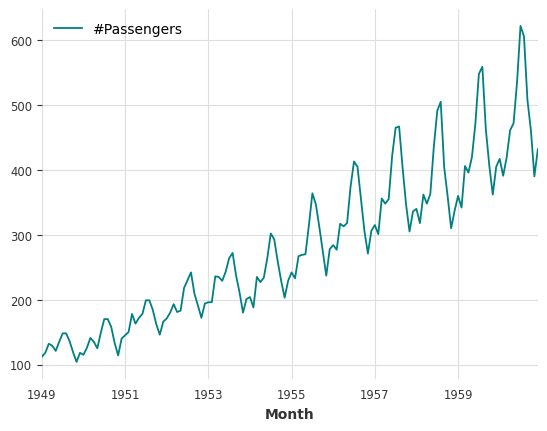

In [9]:
# Se grafica la serie
df.plot(color='teal');

Vemos que la serie tiene una clara tendencia y estacionalidad

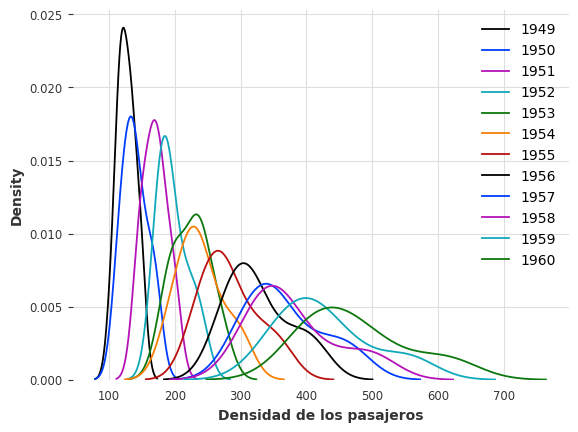

In [10]:
# Se grafica la densidad de los pasajeros para los distintos años
df = pd.read_csv(url, parse_dates=['Month'], index_col='Month')
df.reset_index(inplace=True)

df['year'] = [d.year for d in df.Month]
df['month'] = [d.strftime('%b') for d in df.Month]
years = df['year'].unique()
df.groupby('year')['#Passengers'].apply(lambda x: sn.distplot(x,
        hist=False, rug=False,label = x.name));
plt.legend()
plt.xlabel('Densidad de los pasajeros');

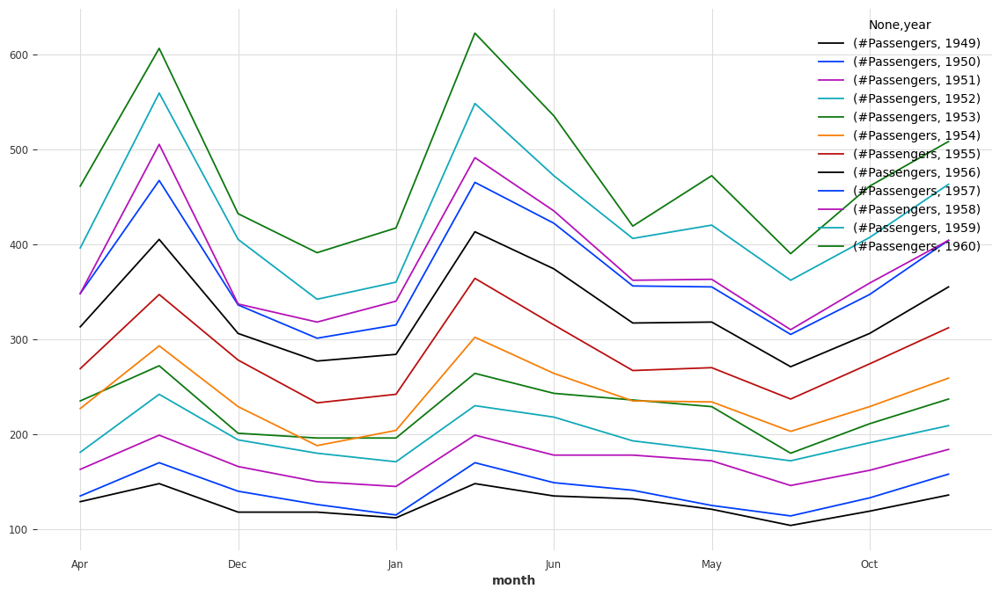

In [11]:
# Evolución de los pasajeros por año
piv = pd.pivot_table(df ,index=['month'],columns=['year'], values=['#Passengers'])
piv.plot(figsize=(14,8));

In [12]:
piv

#Passengers                                                          \
year         1949   1950   1951   1952   1953   1954   1955   1956   1957   
month                                                                       
Apr         129.0  135.0  163.0  181.0  235.0  227.0  269.0  313.0  348.0   
Aug         148.0  170.0  199.0  242.0  272.0  293.0  347.0  405.0  467.0   
Dec         118.0  140.0  166.0  194.0  201.0  229.0  278.0  306.0  336.0   
Feb         118.0  126.0  150.0  180.0  196.0  188.0  233.0  277.0  301.0   
Jan         112.0  115.0  145.0  171.0  196.0  204.0  242.0  284.0  315.0   
Jul         148.0  170.0  199.0  230.0  264.0  302.0  364.0  413.0  465.0   
Jun         135.0  149.0  178.0  218.0  243.0  264.0  315.0  374.0  422.0   
Mar         132.0  141.0  178.0  193.0  236.0  235.0  267.0  317.0  356.0   
May         121.0  125.0  172.0  183.0  229.0  234.0  270.0  318.0  355.0   
Nov         104.0  114.0  146.0  172.0  180.0  203.0  237.0  271.0  305.0   
Oct         119.0  133.0  162.0  191.0  211.0  229.0  274.0  306.0  347.0   
Sep         136.0  158.0  184.0  209.0  237.0  259.0  312.0  355.0  404.0   

                            
year    1958   1959   1960  
month                       
Apr    348.0  396.0  461.0  
Aug    505.0  559.0  606.0  
Dec    337.0  405.0  432.0  
Feb    318.0  342.0  391.0  
Jan    340.0  360.0  417.0  
Jul    491.0  548.0  622.0  
Jun    435.0  472.0  535.0  
Mar    362.0  406.0  419.0  
May    363.0  420.0  472.0  
Nov    310.0  362.0  390.0  
Oct    359.0  407.0  461.0  
Sep    404.0  463.0  508.0

In [13]:
# Reordenar los índices para que los meses aparezcan en orden cronológico
meses_ordenados = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
piv = piv.reindex(meses_ordenados)

In [14]:
piv

#Passengers                                                          \
year         1949   1950   1951   1952   1953   1954   1955   1956   1957   
month                                                                       
Jan         112.0  115.0  145.0  171.0  196.0  204.0  242.0  284.0  315.0   
Feb         118.0  126.0  150.0  180.0  196.0  188.0  233.0  277.0  301.0   
Mar         132.0  141.0  178.0  193.0  236.0  235.0  267.0  317.0  356.0   
Apr         129.0  135.0  163.0  181.0  235.0  227.0  269.0  313.0  348.0   
May         121.0  125.0  172.0  183.0  229.0  234.0  270.0  318.0  355.0   
Jun         135.0  149.0  178.0  218.0  243.0  264.0  315.0  374.0  422.0   
Jul         148.0  170.0  199.0  230.0  264.0  302.0  364.0  413.0  465.0   
Aug         148.0  170.0  199.0  242.0  272.0  293.0  347.0  405.0  467.0   
Sep         136.0  158.0  184.0  209.0  237.0  259.0  312.0  355.0  404.0   
Oct         119.0  133.0  162.0  191.0  211.0  229.0  274.0  306.0  347.0   
Nov         104.0  114.0  146.0  172.0  180.0  203.0  237.0  271.0  305.0   
Dec         118.0  140.0  166.0  194.0  201.0  229.0  278.0  306.0  336.0   

                            
year    1958   1959   1960  
month                       
Jan    340.0  360.0  417.0  
Feb    318.0  342.0  391.0  
Mar    362.0  406.0  419.0  
Apr    348.0  396.0  461.0  
May    363.0  420.0  472.0  
Jun    435.0  472.0  535.0  
Jul    491.0  548.0  622.0  
Aug    505.0  559.0  606.0  
Sep    404.0  463.0  508.0  
Oct    359.0  407.0  461.0  
Nov    310.0  362.0  390.0  
Dec    337.0  405.0  432.0

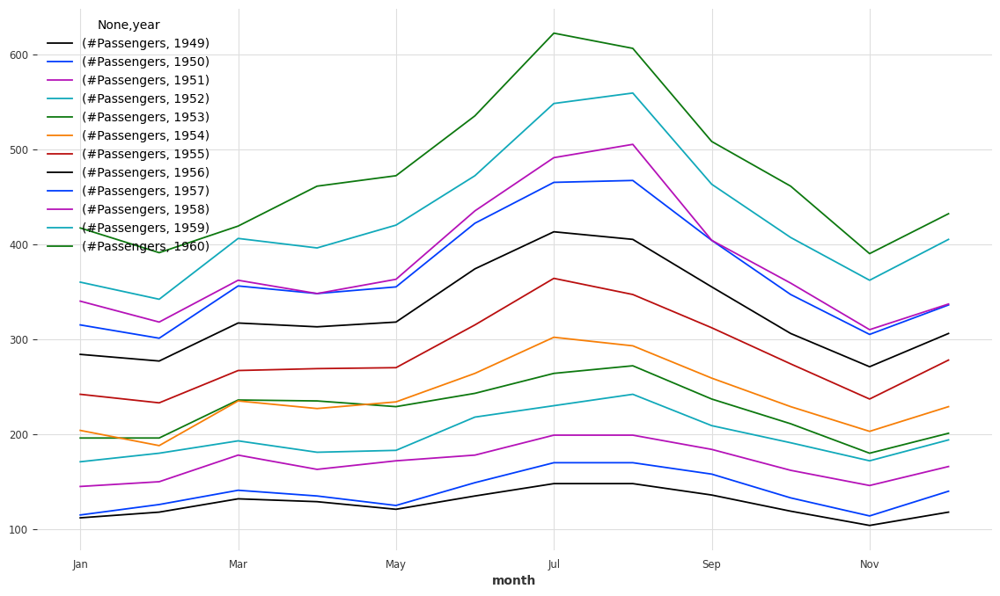

In [15]:
piv.plot(figsize=(14,8));

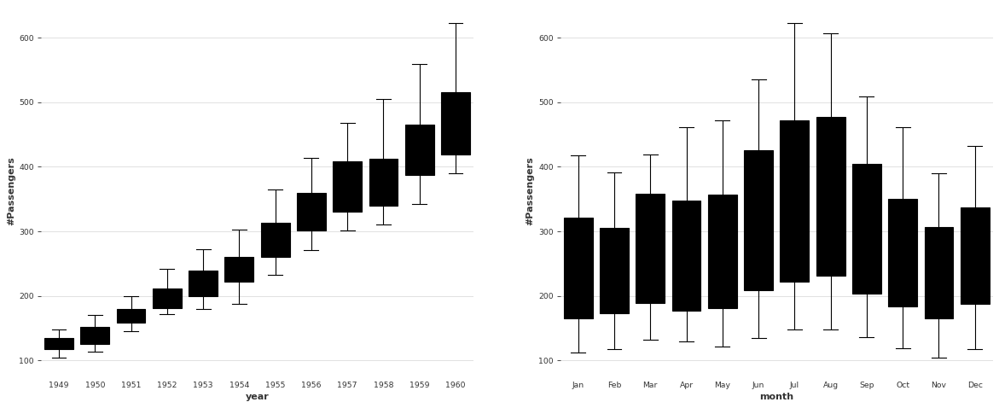

In [16]:
# Box plot de la cantidad de pasajeros por año y por mes
fig, axes = plt.subplots(1, 2, figsize=(18,7), dpi= 80)
sn.boxplot(x='year', y='#Passengers', data=df, ax=axes[0]);
sn.boxplot(x='month', y='#Passengers', data=df);

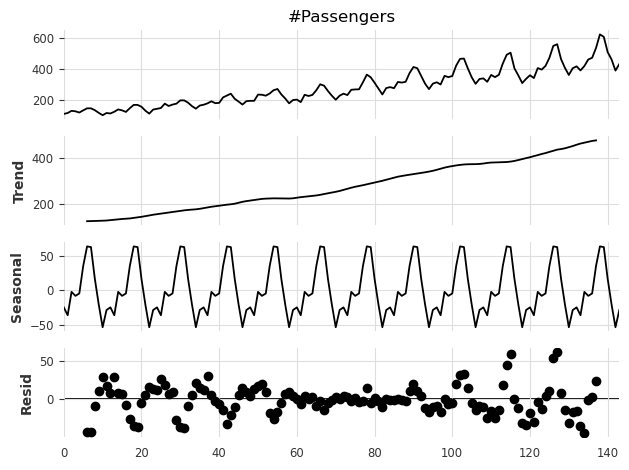

In [17]:
# Descomposición aditiva de la serie
airpax_decompose = sm.tsa.seasonal_decompose(df['#Passengers'], model="additive", period=12)
airpax_decompose.plot()
plt.show()

**Chequeo de Estacionariedad:**

Se dice que una serie temporal es estacionaria si lo siguiente es cierto:

1.   Media constante
2.   Varianza constante
3.   Autocovarianza que no depende del tiempo.

Pero, ¿por qué deberíamos preocuparnos por la estacionariedad? La mayoría de los métodos estadísticos utilizados en el análisis de series de tiempo asumen que la serie es estacionaria. Además, tener una serie estacionaria tiene una ventaja práctica ya que significaría que el comportamiento promedio de la serie será el mismo en el futuro. Por lo tanto, podemos hacer predicciones. Se corroborará la estacionariedad:

In [18]:
# Test de Dickey-Fuller
def test_stationarity(timeseries):
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
test_stationarity(ts)

Results of Dickey-Fuller Test:
Test Statistic                   0.815369
p-value                          0.991880
#Lags Used                      13.000000
Number of Observations Used    130.000000
Critical Value (1%)             -3.481682
Critical Value (5%)             -2.884042
Critical Value (10%)            -2.578770
dtype: float64


La serie no es estacionaria porque:

*   El p-value es mayor que el nivel de confianza típico de 0.05, por lo que no rechazamos la hipótesis nula (existe una raíz unitaria).
*   Los valores críticos de la prueba Dickey-Fuller son mucho más grandes que los estadísticos de la prueba.





In [19]:
# Se define la función de autocorrelación y autocorrelación parcial
lag_acf  = acf(ts.dropna(inplace=False), nlags=20)
lag_pacf = pacf(ts.dropna(inplace=False), nlags=20)

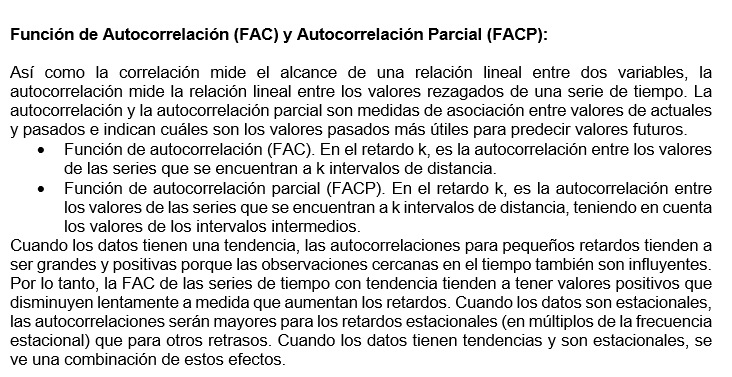

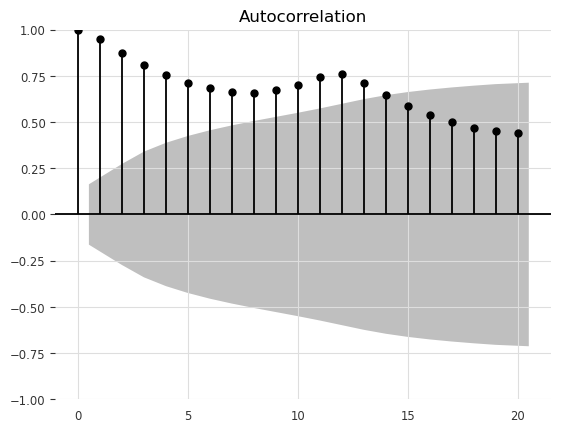

In [20]:
lags = 20
# acf
a=plot_acf(ts.dropna(inplace=False), lags=lags)

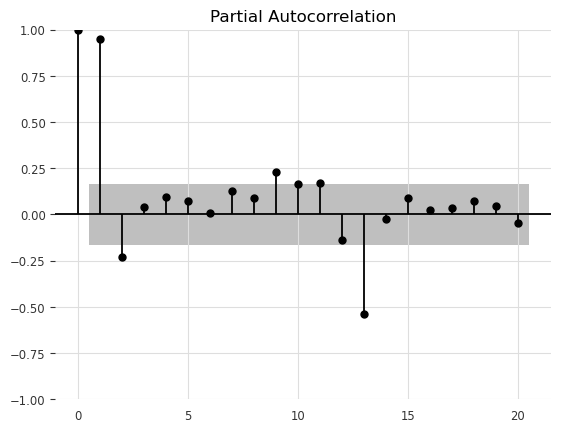

In [21]:
#pacf
b=plot_pacf(ts.dropna(inplace=False),lags=lags)

Para convertir la serie temporal en estacionaria se debe eliminar la tendencia y estacionalidad. Una forma de realizar esto es mediante la diferenciación.

In [22]:
# Equivalente del ndiffs y nsdiffs de R (ver: http://alkaline-ml.com/pmdarima/1.5.1/modules/classes.html#differencing-helpers)
print(pm.arima.ndiffs(ts))
print(pm.arima.nsdiffs(ts,m=12))

1
1


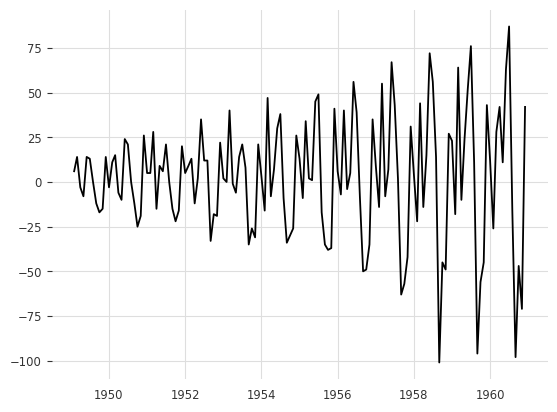

Results of Dickey-Fuller Test:
Test Statistic                  -2.829267
p-value                          0.054213
#Lags Used                      12.000000
Number of Observations Used    130.000000
Critical Value (1%)             -3.481682
Critical Value (5%)             -2.884042
Critical Value (10%)            -2.578770
dtype: float64


In [23]:
# Se diferencia la serie 1 período
nonseasonal_diff = ts.diff(periods=1)
plt.plot(nonseasonal_diff)
plt.show()
test_stationarity(nonseasonal_diff.dropna(inplace=False))

La serie sigue siendo no estacionaria

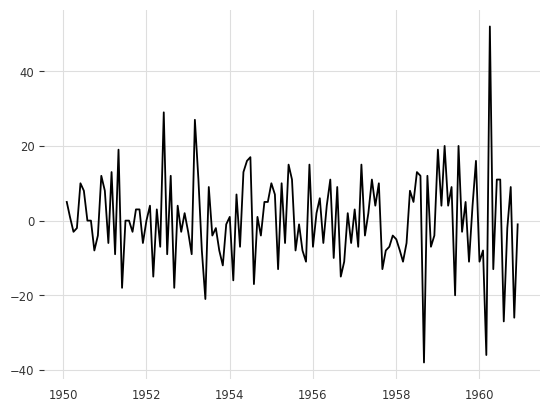

Results of Dickey-Fuller Test:
Test Statistic                -1.559562e+01
p-value                        1.856512e-28
#Lags Used                     0.000000e+00
Number of Observations Used    1.300000e+02
Critical Value (1%)           -3.481682e+00
Critical Value (5%)           -2.884042e+00
Critical Value (10%)          -2.578770e+00
dtype: float64


In [24]:
# Se diferencia la serie 12 períodos
seasonal_diff = nonseasonal_diff.diff(periods=12)
plt.plot(seasonal_diff)
plt.show()
test_stationarity(seasonal_diff.dropna(inplace=False))

La serie es estacionaria

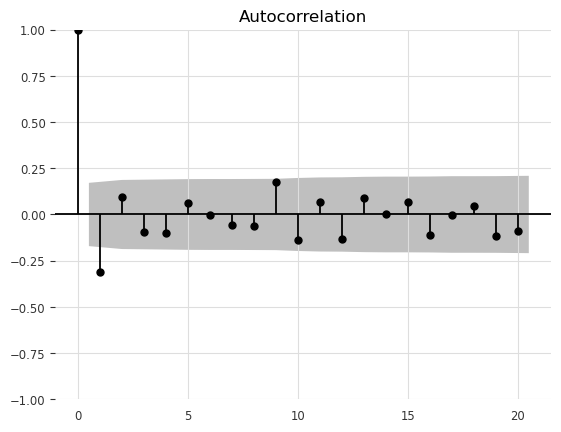

In [25]:
a=plot_acf(seasonal_diff.dropna(inplace=False), lags=20)

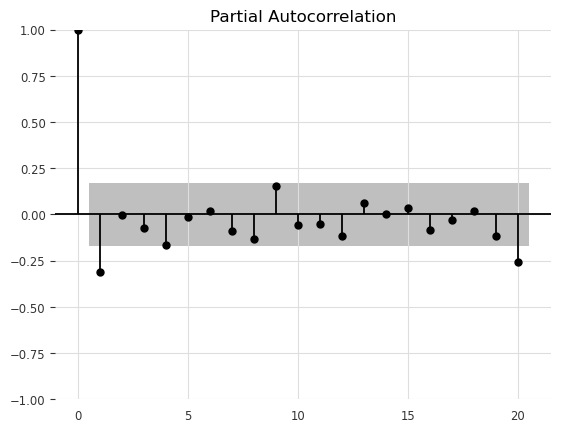

In [26]:
b=plot_pacf(seasonal_diff.dropna(inplace=False),lags=lags)

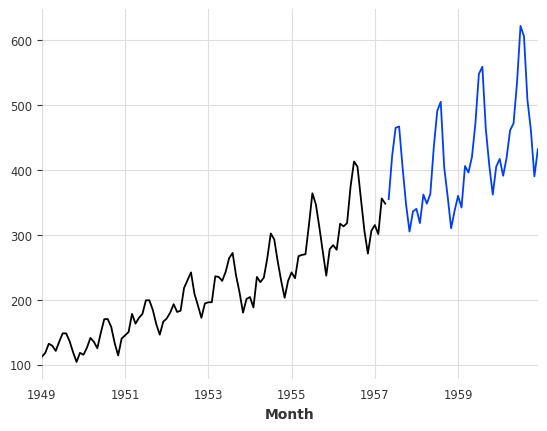

In [27]:
# Se divide en entranamiento (70%) y testeo (30%)
train = ts[:int(0.7*(len(df)))]
test = ts[int(0.7*(len(df))):]

# Se grafican ambos conjuntos de datos
ax = train.plot()
test.plot(ax=ax);

## **ARIMA**
[Teoría ARIMA](https://bookdown.org/amanas/traficomadrid/m%C3%A9todos-param%C3%A9tricos.html#m%C3%A9todo-arima)

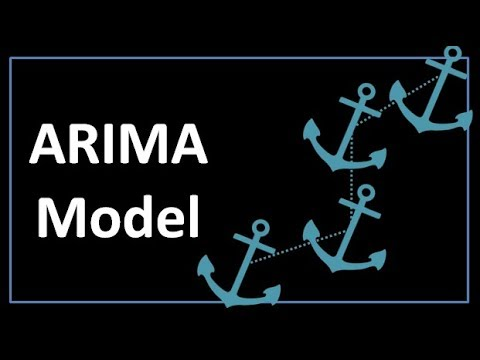

In [28]:
YouTubeVideo('3UmyHed0iYE')
# https://www.youtube.com/watch?v=3UmyHed0iYE

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=909.769, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=907.370, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=904.979, Time=0.02 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=908.785, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=900.136, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=904.858, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=898.911, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=903.548, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=906.025, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=896.369, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=903.746, Time=0.02 se

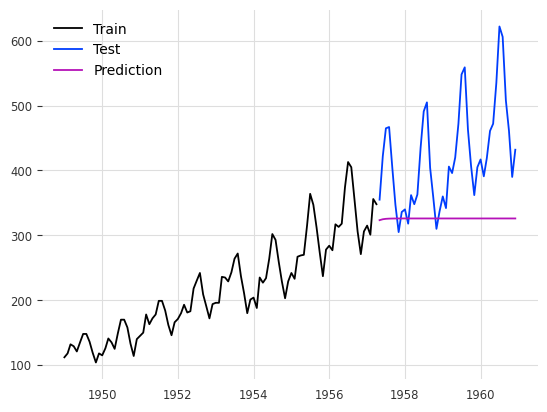

In [29]:
# Se construye el modelo ARIMA
df = pd.read_csv(url,parse_dates = ['Month'],index_col='Month',date_parser = custom_date_parser)
train = df[:int(0.7*(len(df)))]
test = df[int(0.7*(len(df))):]

model = auto_arima(train, trace=True, error_action='ignore', suppress_warnings=True)
model.fit(train)

forecast = model.predict(n_periods=len(test))
forecast = pd.DataFrame(forecast,index = test.index,columns=['Prediction'])

# Se grafican las bases de entrenamiento, testeo y las predicciones
plt.plot(train, label='Train')
plt.plot(test, label='Test')
plt.plot(forecast, label='Prediction')
plt.legend(loc='best')
plt.show()

In [30]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  100
Model:               SARIMAX(1, 1, 2)   Log Likelihood                -443.946
Date:                Sun, 26 Nov 2023   AIC                            895.892
Time:                        19:33:38   BIC                            906.272
Sample:                    01-01-1949   HQIC                           900.092
                         - 04-01-1957                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4654      0.133      3.489      0.000       0.204       0.727
ma.L1         -0.2326      0.141     -1.653      0.098      -0.508       0.043
ma.L2         -0.5172      0.099     -5.224      0.000      -0.711      -0.323
sigma2       456.8414     83.534      5.469      0.000     293.118     620.565
===================================================================================
Ljung-Box (L1) (Q):                   0.48   Jarque-Bera (JB):                 3.74
Prob(Q):                              0.49   Prob(JB):                         0.15
Heteroskedasticity (H):               3.72   Skew:                             0.31
Prob(H) (two-sided):                  0.00   Kurtosis:                         2.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [31]:
# Cálculo de las medidas de precisión
rmse = sqrt(mean_squared_error(test, forecast))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(test, forecast)
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(test, forecast)
print('Test MAE: %.3f' % mae)
r2 = r2_score(test, forecast)
print('Test R2: %.3f' % r2)

Test RMSE: 122.024
Test MSE: 14889.769
Test MAE: 97.192
Test R2: -1.548


## SARIMA
[Teoría SARIMA](https://bookdown.org/amanas/traficomadrid/m%C3%A9todos-param%C3%A9tricos.html#m%C3%A9todo-sarima---arima-estacional)

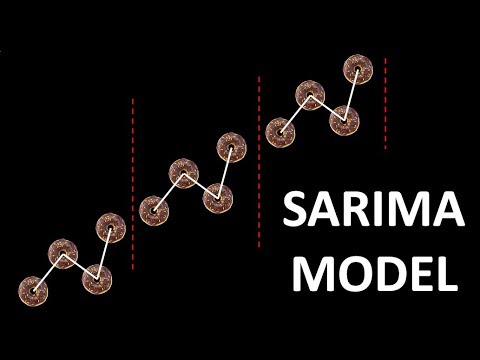

In [32]:
YouTubeVideo('WjeGUs6mzXg')
# https://www.youtube.com/watch?v=WjeGUs6mzXg

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=647.761, Time=0.32 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=650.796, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=644.203, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=644.733, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=645.995, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=646.172, Time=0.13 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=646.187, Time=0.10 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=644.600, Time=0.08 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=647.442, Time=0.04 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=646.085, Time=0.07 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=645.647, Time=0.09 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=644.346, Time=0.05 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=647.580, Time=0.13 sec
 ARIMA(1,1,0)(1,1,0)[12] intercept   

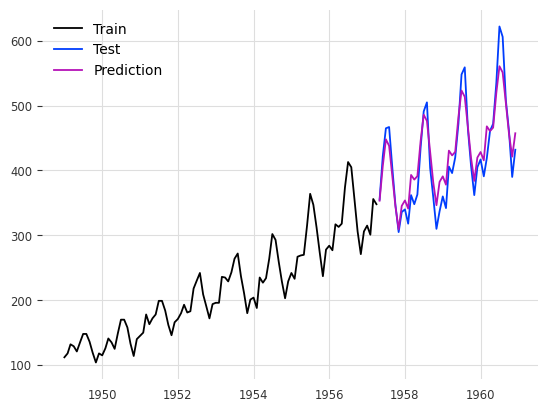

In [33]:
# Se construye el modelo SARIMA
df = pd.read_csv(url,parse_dates = ['Month'],index_col='Month',date_parser = custom_date_parser)
train = df[:int(0.7*(len(df)))]
test = df[int(0.7*(len(df))):]

from pmdarima.arima import auto_arima
model = auto_arima(train, trace=True, error_action='ignore', suppress_warnings=True,seasonal=True,m=12,D=1) #Seasonal=True hace al modelo SARIMA
model.fit(train)

forecast = model.predict(n_periods=len(test))
forecast = pd.DataFrame(forecast,index = test.index,columns=['Prediction'])

# Se grafican las bases de entrenamiento, testeo y las predicciones
plt.plot(train, label='Train')
plt.plot(test, label='Test')
plt.plot(forecast, label='Prediction')
plt.legend(loc='best')
plt.show()

In [34]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  100
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -319.101
Date:                            Sun, 26 Nov 2023   AIC                            644.203
Time:                                    19:33:41   BIC                            651.601
Sample:                                01-01-1949   HQIC                           647.182
                                     - 04-01-1957                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2434      0.097     -2.512      0.012      -0.433      -0.054
ar.S.L12      -0.2127      0.087     -2.432      0.015      -0.384      -0.041
sigma2        89.1842     14.080      6.334      0.000      61.587     116.781
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 2.43
Prob(Q):                              0.97   Prob(JB):                         0.30
Heteroskedasticity (H):               1.32   Skew:                             0.40
Prob(H) (two-sided):                  0.46   Kurtosis:                         2.81
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

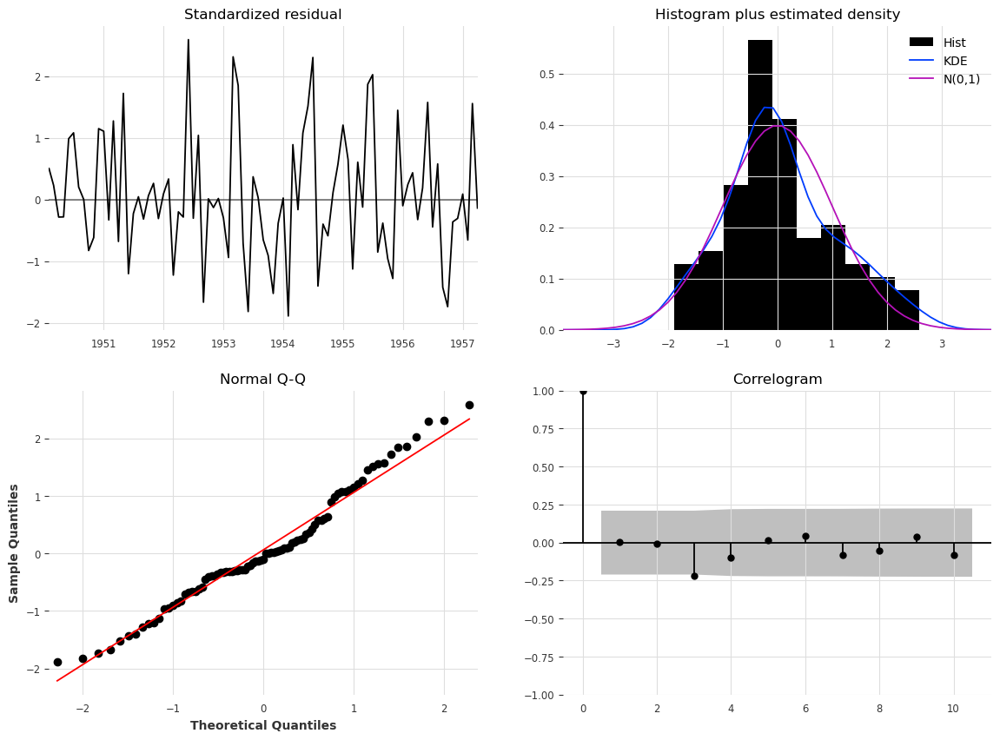

In [35]:
model.plot_diagnostics(figsize=(14,10))
plt.show()

In [36]:
# Cálculo de las medidas de precisión
rmse = sqrt(mean_squared_error(test, forecast))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(test, forecast)
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(test, forecast)
print('Test MAE: %.3f' % mae)
r2 = r2_score(test, forecast)
print('Test R2: %.3f' % r2)

Test RMSE: 26.206
Test MSE: 686.748
Test MAE: 21.539
Test R2: 0.882


## **Prophet o Facebook Prophet**
[Página Oficial](https://facebook.github.io/prophet/) [Fuente del Ejemplo](https://www.kaggle.com/prashant111/tutorial-time-series-forecasting-with-prophet?scriptVersionId=50165664)  

https://facebook.github.io/prophet/docs/installation.html#python

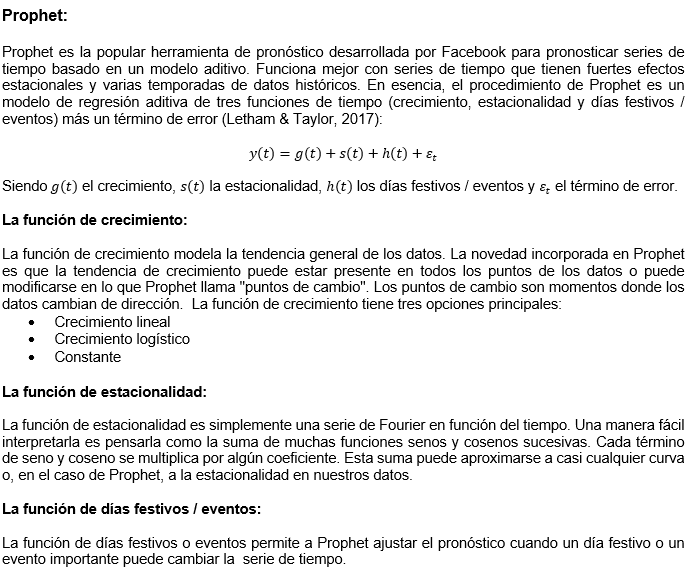

In [37]:
# Se carga la base
df = pd.read_csv(url)
df['Month'] = pd.to_datetime(df['Month'])
df.head()

,Month,#Passengers
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121


La entrada a Prophet es siempre un dataframe con dos columnas: **ds** e **y**.

La columna **ds** (date stamp) debe tener el formato usado por Pandas, idealmente AAAA-MM-DD para una fecha o AAAA-MM-DD HH: MM: SS para tiempo.

La columna **y** debe ser numérica y representa la medida que deseamos pronosticar.

In [38]:
# Se redefinen las variables para poder aplicar la librería Prophet
df = df.rename({'Month':'ds','#Passengers':'y'}, axis='columns')
df.head()

,ds,y
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121


In [39]:
# Se define la base de entrenamiento (70%) y testeo (30%)
train = df[:int(0.7*(len(df)))]
test = df[int(0.7*(len(df))):]
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 100 to 143
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      44 non-null     datetime64[ns]
 1   y       44 non-null     int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 836.0 bytes


In [41]:
from prophet import Prophet
from prophet.plot import add_changepoints_to_plot

In [43]:
# Se inicializa y entrena el modelo
# Se define el intervalo de confianza en 95% (el valor por default es 80%)
m = Prophet(interval_width=0.95)
m.fit(train)

19:35:02 - cmdstanpy - INFO - Chain [1] start processing
19:35:02 - cmdstanpy - INFO - Chain [1] done processing


In [44]:
# Se define la cantidad de períodos a predecir. 44 equivale a la base de testeo
future = m.make_future_dataframe(periods=44, freq='MS')

En el parámetro freq se define la frecuencia mensual (MS) para las predicciones

In [45]:
# Se generan las predicciones
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
139,1960-08-01,522.009483,493.084809,548.591371
140,1960-09-01,490.311954,463.788907,518.298107
141,1960-10-01,463.493389,437.219504,491.258853
142,1960-11-01,440.151471,412.540247,468.471312
143,1960-12-01,465.634380,438.668082,492.934207


*   yhat: es la predicción
*   yhat_lower: es el límite inferior de la predicción
*   yhat_upper: es el límite superior de la predicción

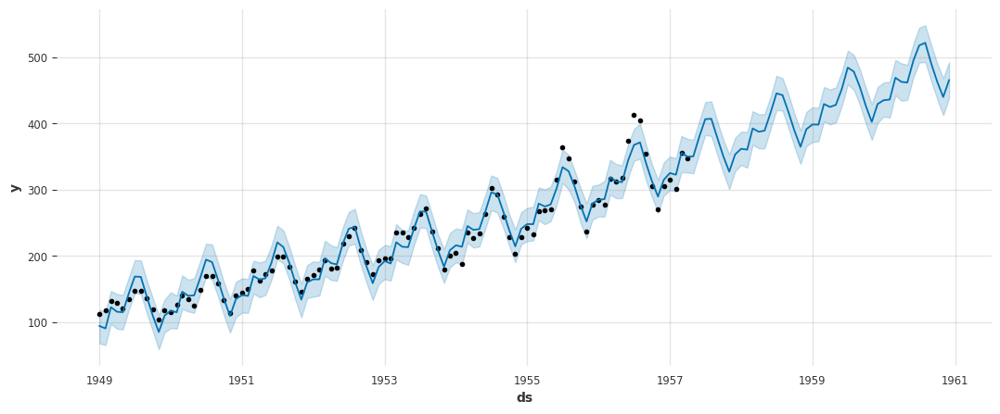

In [46]:
# Se grafican las predicciones (línea) y la base de entranamiento (puntos)
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(13)
fig = m.plot(forecast,ax=ax)
plt.show()

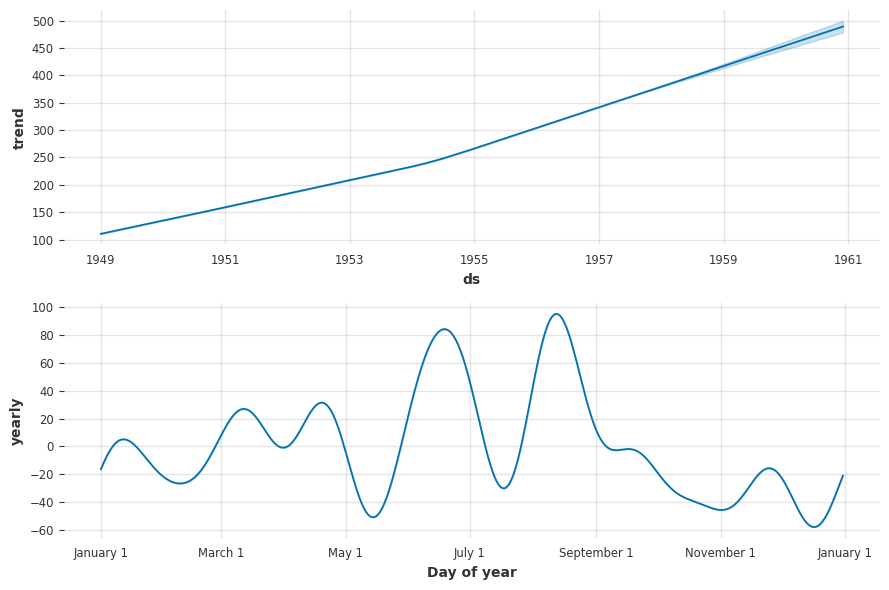

In [47]:
# Se grafican las componenestes de las predicciones
fig2 = m.plot_components(forecast)

Estos gráficos muestran que la tendencia de pasajeros es creciente con los años y que los meses de más tráfico son los de las vacaciones de Julio y Agosto

In [48]:
# Configuración para obtener gráficos interactivos
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go

In [49]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [50]:
from prophet.plot import plot_plotly, plot_components_plotly

In [51]:
#import plotly.express as px
configure_plotly_browser_state()
init_notebook_mode(connected=False)
fig = plot_plotly(m, forecast) # Replace with your own data
fig.show()

In [52]:
# Se grafican las componentes de las predicciones
configure_plotly_browser_state()
init_notebook_mode(connected=False)
fig = plot_components_plotly(m, forecast)
fig.show()


Los puntos de cambio son aquellos momentos donde la serie tiene un cambio abrupto en su trayectoria. Por default Prophet agrega 25 puntos de cambio al 80% del conjunto de datos.

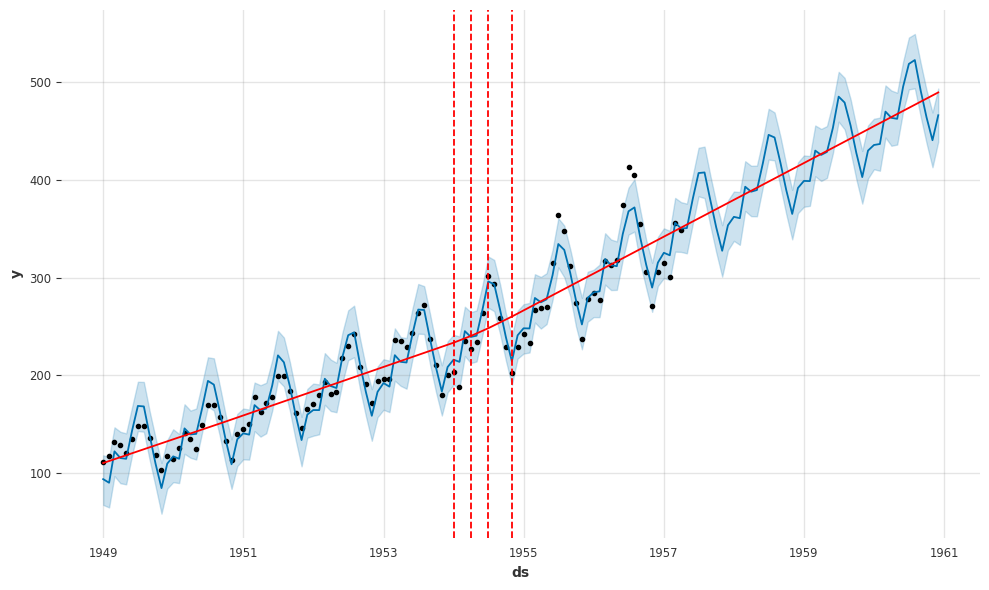

In [53]:
# Se grafican los puntos de cambio
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

In [54]:
m.changepoints

3    1949-04-01
6    1949-07-01
9    1949-10-01
13   1950-02-01
16   1950-05-01
19   1950-08-01
22   1950-11-01
25   1951-02-01
28   1951-05-01
32   1951-09-01
35   1951-12-01
38   1952-03-01
41   1952-06-01
44   1952-09-01
47   1952-12-01
51   1953-04-01
54   1953-07-01
57   1953-10-01
60   1954-01-01
63   1954-04-01
66   1954-07-01
70   1954-11-01
73   1955-02-01
76   1955-05-01
79   1955-08-01
Name: ds, dtype: datetime64[ns]

In [55]:
# Se generan las predicciones para la base de testeo
X_tst_forecast = m.predict(test)
X_tst_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
39,1960-08-01,522.009483,496.701137,547.752354
40,1960-09-01,490.311954,461.648909,518.179019
41,1960-10-01,463.493389,433.269594,493.373365
42,1960-11-01,440.151471,412.871697,467.287283
43,1960-12-01,465.634380,436.477416,495.732604


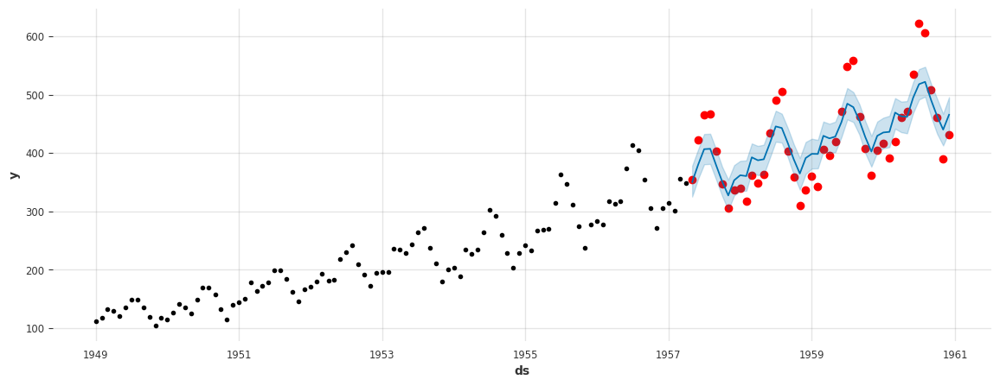

In [56]:
# Se grafican la base de entrenamiento (punteado negro), la de testeo (punteado rojo) y las predicciones (azul)
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(14)
ax.scatter(test.ds, test['y'], color='r')
fig = m.plot(X_tst_forecast, ax=ax)

In [57]:
# Cálculo de las medidas de precisión
rmse = sqrt(mean_squared_error(test['y'], X_tst_forecast['yhat']))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(test['y'], X_tst_forecast['yhat'])
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(test['y'], X_tst_forecast['yhat'])
print('Test MAE: %.3f' % mae)
r2 = r2_score(test['y'], X_tst_forecast['yhat'])
print('Test R2: %.3f' % r2)

Test RMSE: 41.872
Test MSE: 1753.295
Test MAE: 35.057
Test R2: 0.700


## **Neural Prophet**


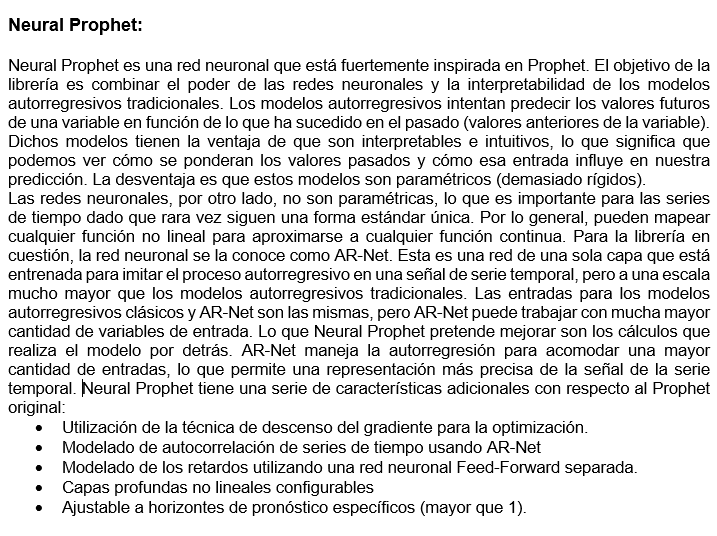

https://neuralprophet.com/how-to-guides/feature-guides/collect_predictions.html

In [78]:
if "google.colab" in str(get_ipython()):
    # uninstall preinstalled packages from Colab to avoid conflicts
    !pip uninstall -y torch notebook notebook_shim tensorflow tensorflow-datasets prophet torchaudio torchdata torchtext torchvision
    !pip install git+https://github.com/ourownstory/neural_prophet.git # may take a while
    #!pip install neuralprophet # much faster, but may not have the latest upgrades/bugfixes

import pandas as pd
from neuralprophet import NeuralProphet, set_log_level
import plotly

set_log_level("ERROR")

In [79]:
from pandas import DataFrame
from pandas import concat
import random
from scipy import stats
import numpy as np
import pandas as pd
from math import sqrt
from numpy import concatenate
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from pandas import DataFrame
from pandas import concat
import seaborn as sn
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [80]:
# Se carga la base
url='https://raw.githubusercontent.com/braiandrago/AST/main/AirPassengers.csv'
df = pd.read_csv(url)
df['Month'] = pd.to_datetime(df['Month'])
df.head()

,Month,#Passengers
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121


In [81]:
# Se redefinen las variables para poder aplicar la librería Prophet
df = df.rename({'Month':'ds','#Passengers':'y'}, axis='columns')
df.head()

,ds,y
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121


In [82]:
# Se define la base de entrenamiento (70%) y testeo (30%)
train = df[:int(0.7*(len(df)))]
test = df[int(0.7*(len(df))):]
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 100 to 143
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      44 non-null     datetime64[ns]
 1   y       44 non-null     int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 836.0 bytes


In [83]:
# Se inicializa y entrena el modelo
m = NeuralProphet()
metrics = m.fit(train, freq="MS")

Finding best initial lr:   0%|          | 0/207 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

In [99]:
# Se generan las predicciones
future = m.make_future_dataframe(train,n_historic_predictions=True ,periods=44)
forecast = m.predict(future)

Predicting: 4it [00:00, ?it/s]

In [100]:
forecast

,ds,y,yhat1,trend,season_yearly
0,1949-01-01,112,100.339493,122.030655,-21.691160
1,1949-02-01,118,96.357315,122.420250,-26.062935
2,1949-03-01,132,127.629868,122.772141,4.857729
3,1949-04-01,129,120.801353,123.161728,-2.360376
4,1949-05-01,121,119.973663,123.538757,-3.565092
...,...,...,...,...,...
139,1960-08-01,None,540.560669,491.846008,48.714687
140,1960-09-01,None,508.032104,495.311127,12.720977
141,1960-10-01,None,480.027222,498.664368,-18.637165
142,1960-11-01,None,453.888885,502.129517,-48.240616


In [101]:
m.plot(forecast)

OSError: [Errno 22] Invalid argument

In [93]:
m.plot_components(forecast)

OSError: [Errno 22] Invalid argument

In [94]:
# Se grafican las predicciones y las componentes
m.plot_parameters()

OSError: [Errno 22] Invalid argument

In [95]:
# Se generan las predicciones para la base de testeo
X_tst_forecast = m.predict(test)

Predicting: 4it [00:00, ?it/s]

In [96]:
X_tst_forecast.tail(5)

,ds,y,yhat1,trend,season_yearly
39,1960-08-01,606,540.560669,491.846008,48.714687
40,1960-09-01,508,508.032104,495.311127,12.720977
41,1960-10-01,461,480.027222,498.664368,-18.637165
42,1960-11-01,390,453.888885,502.129517,-48.240616
43,1960-12-01,432,482.881104,505.482758,-22.601673


In [97]:
m.plot(X_tst_forecast)

OSError: [Errno 22] Invalid argument

In [89]:
# Cálculo de las medidas de precisión
rmse = sqrt(mean_squared_error(test['y'], X_tst_forecast['yhat1']))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(test['y'], X_tst_forecast['yhat1'])
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(test['y'], X_tst_forecast['yhat1'])
print('Test MAE: %.3f' % mae)
r2 = r2_score(test['y'], X_tst_forecast['yhat1'])
print('Test R2: %.3f' % r2)

KeyError: 'yhat1'

**Y si adicionamos autorregresión?**

In [ ]:
 # Se inicializa y entrena el modelo
m = NeuralProphet(n_lags=5)
metrics = m.fit(train, freq="MS")

Finding best initial lr:   0%|          | 0/207 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

In [ ]:
# Se generan las predicciones para la base de testeo
X2_tst_forecast = m.predict(test)

Predicting: 6it [00:00, ?it/s]

In [ ]:
X2_tst_forecast

,ds,y,yhat1,ar1,trend,season_yearly
0,1957-05-01,355.0,NaN,NaN,NaN,NaN
1,1957-06-01,422.0,NaN,NaN,NaN,NaN
2,1957-07-01,465.0,NaN,NaN,NaN,NaN
3,1957-08-01,467.0,NaN,NaN,NaN,NaN
4,1957-09-01,404.0,NaN,NaN,NaN,NaN
5,1957-10-01,347.0,387.686005,651.496399,-244.470215,-19.340174
6,1957-11-01,305.0,363.208252,657.422852,-246.293884,-47.920746
7,1957-12-01,336.0,375.137543,646.223877,-248.058777,-23.027569
8,1958-01-01,340.0,371.952728,642.617493,-249.882477,-20.782284
9,1958-02-01,318.0,354.152527,632.203674,-251.706207,-26.344950


In [ ]:
# Se grafican la base de entrenamiento (punteado negro) y las predicciones (azul)
m.plot(X2_tst_forecast)

Acondicionamiento para cálculo de métricas por los lags:

In [102]:
lag_tst_forecast=X2_tst_forecast['yhat1'].dropna()

NameError: name 'X2_tst_forecast' is not defined

In [103]:
lag_test = test['y'][5:]

In [104]:
# Cálculo de las medidas de precisión
rmse = sqrt(mean_squared_error(lag_test, lag_tst_forecast))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(lag_test, lag_tst_forecast)
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(lag_test, lag_tst_forecast)
print('Test MAE: %.3f' % mae)
r2 = r2_score(lag_test, lag_tst_forecast)
print('Test R2: %.3f' % r2)

NameError: name 'lag_tst_forecast' is not defined

**Neural Prophet Multivariado**

**Energy price data over the 4 years from Spain**  
Fuente del dataset: https://www.kaggle.com/datasets/nicholasjhana/energy-consumption-generation-prices-and-weather

Features:    
*y*: Hourly energy price data    
*temperature*: the extra temperature column

In [105]:
df = pd.read_csv("https://github.com/ourownstory/neuralprophet-data/raw/main/kaggle-energy/datasets/tutorial04.csv")
df.head()

,ds,y,temperature
0,2015-01-01,64.92,277.00
1,2015-01-02,58.46,277.95
2,2015-01-03,63.35,278.83
3,2015-01-04,50.54,279.64
4,2015-01-05,64.89,279.05


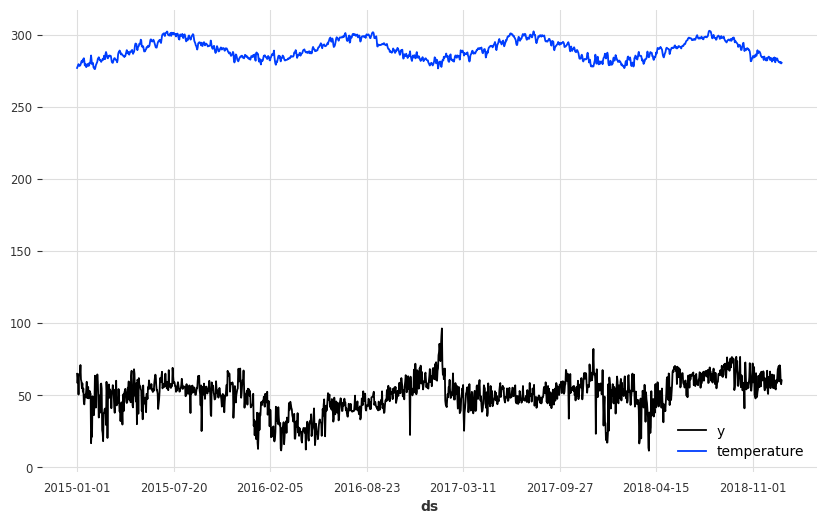

In [106]:
fig = df.plot(x="ds", y=["y", "temperature"], figsize=(10, 6))

In [107]:
df_train, df_val = m.split_df(df, valid_p=0.2)

print("Dataset size:", len(df))
print("Train dataset size:", len(df_train))
print("Validation dataset size:", len(df_val))

Dataset size: 1461
Train dataset size: 1169
Validation dataset size: 292


In [108]:
m = NeuralProphet(
    # Disable trend changepoints
    n_changepoints=10,
    # Disable seasonality components
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=True,
    # Add the autogression
    n_lags=10,)

In [109]:
# Add the new lagged regressor
m.add_lagged_regressor("temperature")

Finding best initial lr:   0%|          | 0/227 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,49.918964,63.352882,0.801952,0.0,0,52.007126,63.197849,0.633338,0.0
1,41.265793,53.014015,0.643186,0.0,1,42.507374,51.662682,0.498168,0.0
2,32.416317,42.089272,0.479888,0.0,2,32.887222,40.523327,0.365590,0.0
3,24.254364,32.012100,0.332482,0.0,3,26.248491,32.303429,0.270562,0.0
4,19.547232,25.552483,0.247259,0.0,4,19.668463,24.919205,0.186780,0.0
...,...,...,...,...,...,...,...,...,...
180,5.482964,6.874737,0.027621,0.0,180,4.913069,6.615079,0.018922,0.0
181,5.429895,6.819652,0.027177,0.0,181,4.784455,6.479759,0.017990,0.0
182,5.395475,6.781378,0.026866,0.0,182,4.787151,6.489874,0.017922,0.0
183,5.450456,6.833841,0.027283,0.0,183,4.709405,6.423142,0.017653,0.0


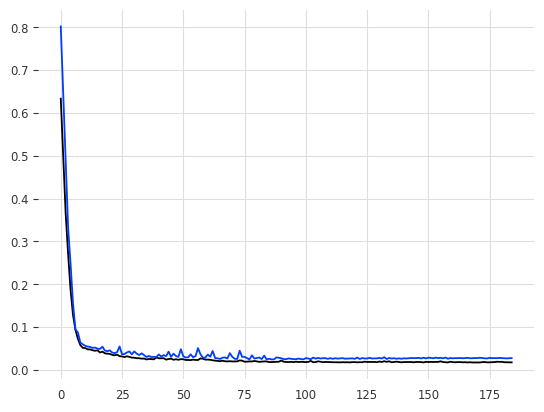

In [110]:
metrics = m.fit(df_train, validation_df=df_val, progress="plot")
metrics

In [111]:
forecast = m.predict(df_val)
m.plot(forecast)

Predicting: 19it [00:00, ?it/s]

FigureWidgetResampler({
    'data': [{'fill': 'none',
              'line': {'color': 'rgba(45, 146, 255, 1.0)', 'width': 2},
              'mode': 'lines',
              'name': 'yhat1',
              'type': 'scatter',
              'uid': '2c70d9dd-6cd8-444f-a97b-016c0574dc5e',
              'x': array([datetime.datetime(2018, 3, 15, 0, 0),
                          datetime.datetime(2018, 3, 16, 0, 0),
                          datetime.datetime(2018, 3, 17, 0, 0), ...,
                          datetime.datetime(2018, 12, 29, 0, 0),
                          datetime.datetime(2018, 12, 30, 0, 0),
                          datetime.datetime(2018, 12, 31, 0, 0)], dtype=object),
              'y': array([      nan,       nan,       nan, ..., 64.647255, 57.138557, 58.409035],
                         dtype=float32)},
             {'marker': {'color': 'black', 'size': 4},
              'mode': 'markers',
              'name': 'Actual',
              'type': 'scatter',
              'ui

In [112]:
m.plot_components(forecast, components=["lagged_regressors"])

FigureWidgetResampler({
    'data': [{'marker': {'color': '#2d92ff'},
              'name': 'Lagged Regressor "temperature"',
              'opacity': 1.0,
              'showlegend': False,
              'type': 'bar',
              'uid': '9a56e4cd-f3c9-4f8c-aeee-21d9d1b47c7e',
              'x': array([datetime.datetime(2018, 3, 25, 0, 0),
                          datetime.datetime(2018, 3, 26, 0, 0),
                          datetime.datetime(2018, 3, 27, 0, 0), ...,
                          datetime.datetime(2018, 12, 29, 0, 0),
                          datetime.datetime(2018, 12, 30, 0, 0),
                          datetime.datetime(2018, 12, 31, 0, 0)], dtype=object),
              'xaxis': 'x',
              'y': array([-0.00375836,  0.5775939 , -2.056531  , ...,  0.59993464,  0.64858645,
                           0.        ], dtype=float32),
              'yaxis': 'y'}],
    'layout': {'autosize': True,
               'barmode': 'overlay',
               'font': {'size':

In [113]:
m.plot_parameters(components=["lagged_regressors"])

FigureWidgetResampler({
    'data': [{'marker': {'color': '#2d92ff'},
              'name': 'Lagged Regressor "temperature"',
              'type': 'bar',
              'uid': 'b9ffa69a-bf16-4e97-ba56-401b865ba647',
              'x': array([10,  9,  8,  7,  6,  5,  4,  3,  2,  1]),
              'xaxis': 'x',
              'y': array([0.1217678 , 0.15338944, 0.15515272, 0.01105662, 0.11130852, 0.09155892,
                          0.00837356, 0.09333154, 0.11026429, 0.14379664], dtype=float32),
              'yaxis': 'y'}],
    'layout': {'autosize': True,
               'font': {'size': 10},
               'height': 210,
               'hovermode': 'x unified',
               'margin': {'b': 0, 'l': 0, 'pad': 0, 'r': 10, 't': 10},
               'showlegend': False,
               'template': '...',
               'title': {'font': {'size': 12}},
               'width': 700,
               'xaxis': {'anchor': 'y',
                         'domain': [0.0, 1.0],
                       

In [114]:
metrics

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,49.918964,63.352882,0.801952,0.0,0,52.007126,63.197849,0.633338,0.0
1,41.265793,53.014015,0.643186,0.0,1,42.507374,51.662682,0.498168,0.0
2,32.416317,42.089272,0.479888,0.0,2,32.887222,40.523327,0.365590,0.0
3,24.254364,32.012100,0.332482,0.0,3,26.248491,32.303429,0.270562,0.0
4,19.547232,25.552483,0.247259,0.0,4,19.668463,24.919205,0.186780,0.0
...,...,...,...,...,...,...,...,...,...
180,5.482964,6.874737,0.027621,0.0,180,4.913069,6.615079,0.018922,0.0
181,5.429895,6.819652,0.027177,0.0,181,4.784455,6.479759,0.017990,0.0
182,5.395475,6.781378,0.026866,0.0,182,4.787151,6.489874,0.017922,0.0
183,5.450456,6.833841,0.027283,0.0,183,4.709405,6.423142,0.017653,0.0


In [115]:
metrics_test = m.test(df=df_val)

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test           0.02768234722316265
         MAE_val             5.499145984649658
        RMSE_val             6.883534908294678
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
